## Import Modules

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output

In [3]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages\Cat\0.jpg 0


In [4]:
print(input_path[10], label[10])

PetImages\Cat\10005.jpg 0


In [5]:
len(label)

25002

In [6]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True) # shuffle
df.head()

,images,label
0,PetImages\Cat\1357.jpg,0
1,PetImages\Dog\6411.jpg,1
2,PetImages\Dog\3205.jpg,1
3,PetImages\Cat\8270.jpg,0
4,PetImages\Dog\1107.jpg,1


In [7]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PetImages\Dog\Thumbs.db
PetImages\Cat\Thumbs.db


In [8]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages\\Dog\\11702.jpg',
 'PetImages\\Cat\\666.jpg',
 'PetImages\\Dog\\Thumbs.db',
 'PetImages\\Cat\\Thumbs.db']

In [9]:
df = df[~df['images'].isin(l)].reset_index(drop=True)

print("Before cleaning:", len(df))
print("After cleaning :", len(df))


Before cleaning: 24998
After cleaning : 24998


In [10]:
len(df)

24998

## Exploratory Data Analysis

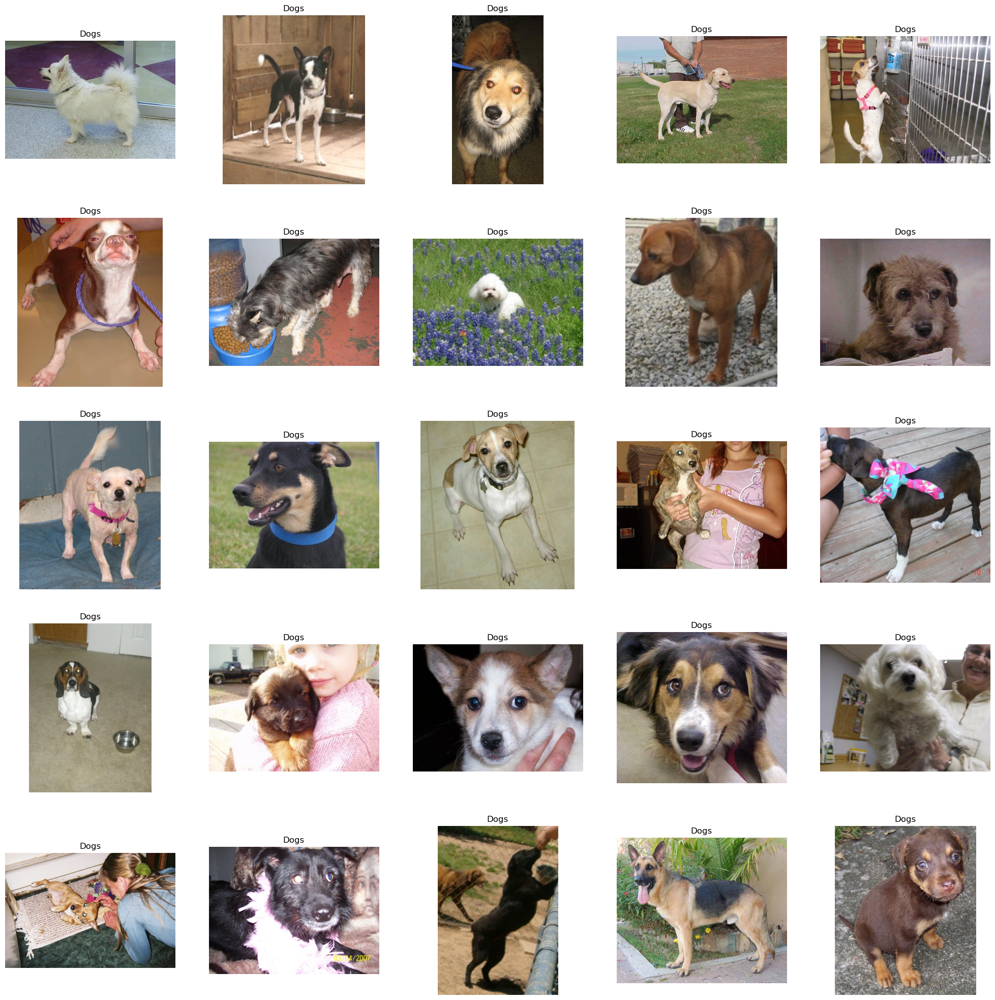

In [11]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

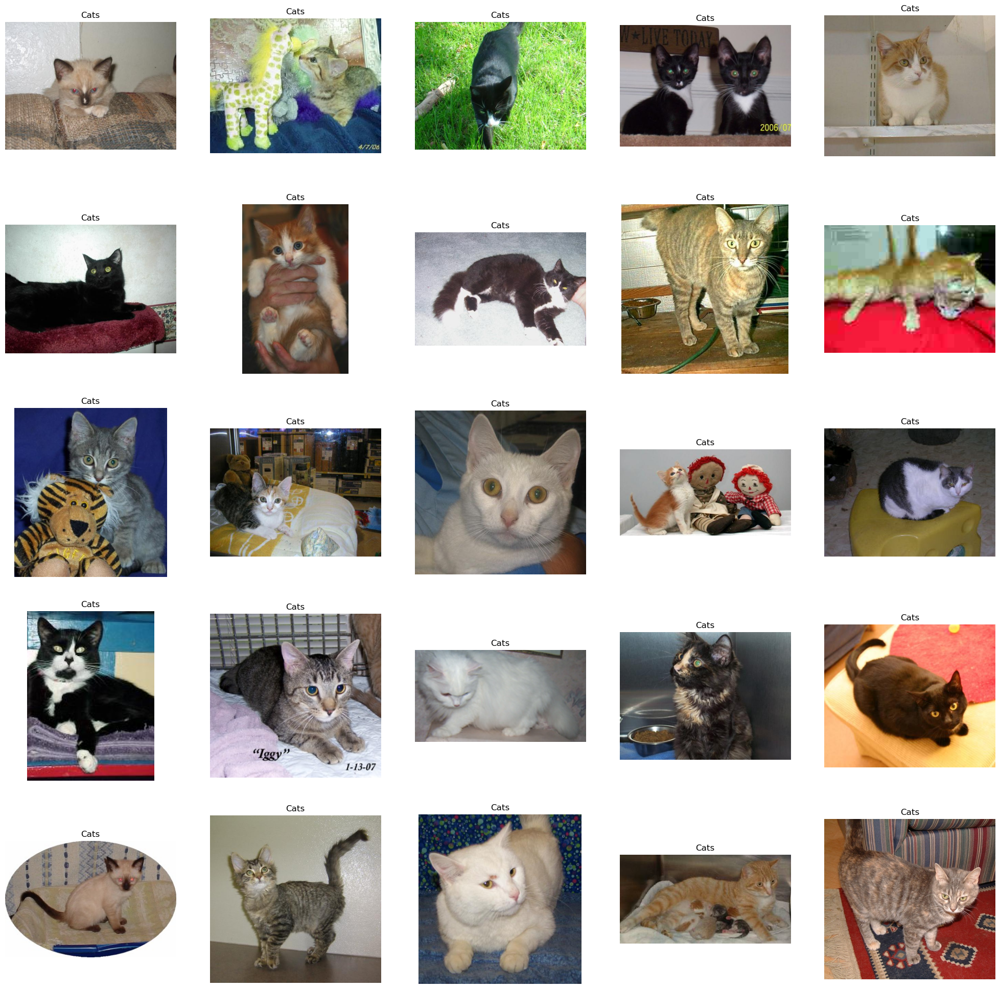

In [12]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

In [13]:
# import seaborn as sns
# sns.barplot(df['label'])
# plt.show()

## Create DataGenerator for the Images

In [14]:
df['label'] = df['label'].astype('str')

In [15]:
df.head()

,images,label
0,PetImages\Cat\1357.jpg,0
1,PetImages\Dog\6411.jpg,1
2,PetImages\Dog\3205.jpg,1
3,PetImages\Cat\8270.jpg,0
4,PetImages\Dog\1107.jpg,1


In [16]:
!pip install scikit-learn

In [17]:
!python.exe -m pip install --upgrade pip

In [18]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [19]:
!pip install --upgrade tensorflow
# You might also need to install the standalone Keras 3 library
!pip install --upgrade keras

In [20]:
#from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [21]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [22]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       6,423,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)


Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 589s 15s/step - accuracy: 0.5820 - loss: 0.6992 - val_accuracy: 0.5848 - val_loss: 0.6796
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 420s 10s/step - accuracy: 0.6581 - loss: 0.6153 - val_accuracy: 0.7016 - val_loss: 0.5679
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 305s 8s/step - accuracy: 0.7071 - loss: 0.5635 - val_accuracy: 0.7356 - val_loss: 0.5266
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 301s 8s/step - accuracy: 0.7175 - loss: 0.5491 - val_accuracy: 0.7200 - val_loss: 0.5442
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 323s 8s/step - accuracy: 0.7383 - loss: 0.5232 - val_accuracy: 0.7494 - val_loss: 0.5040
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 325s 8s/step - accuracy: 0.7593 - loss: 0.4959 - val_accuracy: 0.7900 - val_loss: 0.4618
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 378s 8s/step - accuracy: 0.7697 - loss: 0.4787 - val_accuracy: 0.7704 - val_loss: 0.4679
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 323s 8s/step - accuracy: 0.7609 - loss: 0.4903 - val_accuracy: 0.7924 -

## Visualization of Results

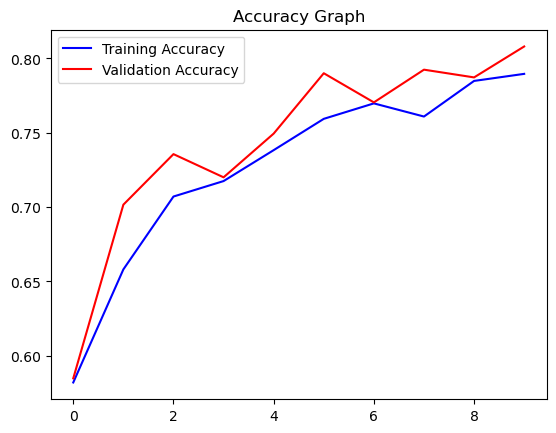

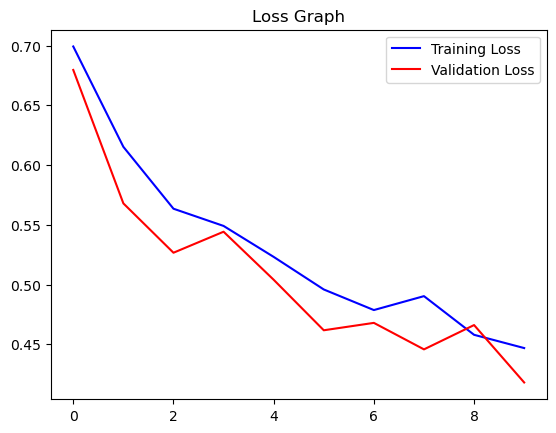

In [24]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test with Real Image

In [25]:
image_path = "test.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
Cat


In [26]:
image_path = "test1.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
Cat
